In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter 
from matplotlib.ticker import EngFormatter
import math
%matplotlib inline


def parse_if_number(s):
    try: return float(s)
    except: return True if s=="true" else False if s=="false" else s if s else None

def parse_ndarray(s):
    return np.fromstring(s, sep=' ') if s else None

# accepts table (dataframe) of loaded statistics, does pivot on the atributes, add them as separate columns and
# runnattr (row) as a column for easy legend plotting
def addItervarsCol(loaded_csv):
    
    #get only three columns (run, attribute name, attribute value)
    itervars_df = loaded_csv.loc[loaded_csv.type=='itervar', ['run', 'attrname', 'attrvalue']]
    #pivot the table around attrname
    itervarsprivot_df = itervars_df.pivot(index = 'run', columns = 'attrname', values = 'attrvalue')
    #merge it with the original table i.e. add the new columns
    loaded_csv_merged = loaded_csv.merge(itervarsprivot_df, left_on='run', right_index=True, how='outer')
    
    # concat all parameters into one and add it as iterationvars column
    itervarscol_df = loaded_csv.loc[(loaded_csv.type=='runattr') & (loaded_csv.attrname.astype(str)=='iterationvars'), ['run', 'attrvalue']]
    itervarscol_df = itervarscol_df.rename(columns={'attrvalue': 'iterationvars'})
    
    #add iterationvars column to the final table
    loaded_csv3 = loaded_csv_merged.merge(itervarscol_df, left_on='run', right_on='run', how='outer')
    
    return loaded_csv3


def resampleVecvalue(loaded_csv, key="10ms"):
    loaded_csv.loc[(loaded_csv.type == "vector"),('resampled')] = loaded_csv.loc[(loaded_csv.type == "vector"),('vectime', 'vecvalue')].apply(lambda x:  pd.DataFrame(pd.Series(x.vecvalue, index = (pd.to_timedelta(x.vectime, unit='s'))).resample(key=key).sum()*8), axis= 1)
    return loaded_csv


def isnan(x):
    if isinstance(x, (int, float, complex)) and math.isnan(x):
        return True
    
def trimTimeDeltaSeries(series, after=pd.Timedelta.max, before=pd.Timedelta.min):
    return series[(series.index >= before) & (series.index <= after)]



In [2]:
# load csv

file_to_load = 'results/udpEcn/Hex_UdpEcnIntAlpha3.csv'
loaded_csv = pd.read_csv(file_to_load, converters = {
    'attrvalue': parse_if_number,
    'binedges': parse_ndarray,
    'binvalues': parse_ndarray,
    'vectime': parse_ndarray,
    'vecvalue': parse_ndarray})

loaded_csv = addItervarsCol(loaded_csv)
loaded_csv.head(10)

,run,type,module,name,attrname,attrvalue,value,vectime,vecvalue,alpha,cross,interval,queueCap,iterationvars
0,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,configname,HexSingleConnUdpRedUdpCrossIntervalAlpha,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
1,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,datetime,20190314-16:57:23,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
2,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,experiment,HexSingleConnUdpRedUdpCrossIntervalAlpha,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
3,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,inifile,omnetpp.ini,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
4,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,iterationvars,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
5,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,iterationvarsf,"queueCap=24,cross=On,1,1,interval=0.01,alpha=0...",NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
6,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,measurement,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
7,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,network,Hexagon,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
8,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,processid,31740,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
9,HexSingleConnUdpRedUdpCrossIntervalAlpha-3-201...,runattr,NaN,NaN,repetition,0,NaN,None,None,0.005,"""On""",0.01,24,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."


In [3]:
#eliminate multiple rows for the same run X module X name (avoids getting 'duplicates' error on pivot later on)

# pd.set_option('max_colwidth', 80)
# save column order
col_order= loaded_csv.columns.tolist()
#create dictionary of reduce functions (need to list all columns)           
agg_dict = {"type": "first","attrname": "first", "attrvalue" : "first","value": "first","vectime": lambda x: list(np.hstack(x)), "vecvalue": lambda x: list(np.hstack(x)), "cross": "first","alpha": "first", "interval": "first","queueCap": "first","iterationvars": "first"}
#get copy of vectors
df_slice = loaded_csv[(loaded_csv.type=="vector")]

loaded_csv = df_slice.groupby(['run', 'module', 'name'], as_index = False).agg(agg_dict) 
loaded_csv = loaded_csv[col_order]
loaded_csv.head(25)

,run,type,module,name,attrname,attrvalue,value,vectime,vecvalue,alpha,cross,interval,queueCap,iterationvars
0,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.client499.app[0],rcvdPk:vector(packetBytes),NaN,None,NaN,"[20.0206672, 20.02079024, 20.02091328, 20.0210...","[1472.0, 1472.0, 1472.0, 1472.0, 1472.0, 1472....",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
1,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.dmpr,congLevel.192.168.4.0_eth[1]:vector,NaN,None,NaN,"[20.01724416, 20.02798048, 20.03824416, 20.048...","[0.0, 0.0, 0.015, 0.04455, 0.0732135, 0.101017...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
2,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.dmpr,congLevel.192.168.4.0_eth[2]:vector,NaN,None,NaN,"[20.01724416, 20.02751792, 20.03824416, 20.049...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
3,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.dmpr,fwdCongLevel.192.168.4.0_eth[1]:vector,NaN,None,NaN,"[20.01724416, 20.02798048, 20.03824416, 20.048...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
4,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.dmpr,fwdCongLevel.192.168.4.0_eth[2]:vector,NaN,None,NaN,"[20.01724416, 20.02751792, 20.03824416, 20.049...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
5,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.dmpr,inUseCongLevel.192.168.4.0_eth[1]:vector,NaN,None,NaN,"[20.01724416, 20.02798048, 20.03824416, 20.048...","[0.0, 0.0, 0.015, 0.04455, 0.0732135, 0.101017...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
6,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.dmpr,inUseCongLevel.192.168.4.0_eth[2]:vector,NaN,None,NaN,"[20.01724416, 20.02751792, 20.03824416, 20.049...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
7,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.eth[1].encap,decapPk:vector(packetBytes),NaN,None,NaN,"[0.093582047472, 0.110985407824, 0.11311020782...","[64.0, 52.0, 52.0, 72.0, 56.0, 84.0, 108.0, 12...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
8,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.eth[1].encap,encapPk:vector(packetBytes),NaN,None,NaN,"[0.108847807824, 0.110985407824, 0.11311020782...","[68.0, 52.0, 72.0, 52.0, 56.0, 84.0, 108.0, 84...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."
9,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,vector,Hexagon.routerCore1.eth[2].encap,decapPk:vector(packetBytes),NaN,None,NaN,"[0.119301817754, 0.121426617754, 0.12359941775...","[68.0, 52.0, 72.0, 68.0, 84.0, 120.0, 46.0, 11...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv..."


In [4]:
# transform vectime and vecvalue into timedelta series for easier manipulation and plotting
# name which columns you want to include (usually all the variables you iterates over)
new_df = loaded_csv[['run', 'queueCap', 'cross', 'alpha', 'interval', 'iterationvars']].drop_duplicates('run').set_index(keys='run')
# print(new_df)
# loaded_csv.loc[:, [0,2,3,7] + list(range(8,loaded_csv.shape[1]))]

vectors = loaded_csv.loc[loaded_csv.type=="vector"]
vectors["module_name"] = vectors["module"].map(str) + "." +  vectors["name"]
vectors = vectors.iloc[:, [0,2,3,7] + list(range(8,vectors.shape[1]))]
# vectors["time_series"] = pd.Series(vectors["vecvalue"], index = pd.to_timedelta(vectors["vectime"],  unit='s'))

# a = vectors.iloc[0, 3]
# b = vectors.iloc[0, 4]
# # print(a)
# # print(b)
# pd.Series(b, index = pd.to_timedelta(a,  unit='s'))
# pd.Series(x["vecvalue"], index = pd.to_timedelta(x["vectime"],  unit='s'))
vectors["ser"] = vectors.apply(lambda x: pd.DataFrame(pd.Series(x["vecvalue"], index = pd.to_timedelta(x["vectime"],  unit='s'))), axis=1) 
# vectors
# vectors.assign(meh=lambda x: pd.Series(x["vecvalue"].tolist(), index = pd.to_timedelta(x["vectime"].tolist(),  unit='s')) )
vectors


,run,module,name,vectime,vecvalue,alpha,cross,interval,queueCap,iterationvars,module_name,ser
0,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.client499.app[0],rcvdPk:vector(packetBytes),"[20.0206672, 20.02079024, 20.02091328, 20.0210...","[1472.0, 1472.0, 1472.0, 1472.0, 1472.0, 1472....",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.client499.app[0].rcvdPk:vector(packetB...,0 00:00:20.020667 1472....
1,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.dmpr,congLevel.192.168.4.0_eth[1]:vector,"[20.01724416, 20.02798048, 20.03824416, 20.048...","[0.0, 0.0, 0.015, 0.04455, 0.0732135, 0.101017...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.dmpr.congLevel.192.168.4.0...,0 00:00:20.017244 ...
2,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.dmpr,congLevel.192.168.4.0_eth[2]:vector,"[20.01724416, 20.02751792, 20.03824416, 20.049...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.dmpr.congLevel.192.168.4.0...,0 00:00:20.017244 0.0 00:0...
3,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.dmpr,fwdCongLevel.192.168.4.0_eth[1]:vector,"[20.01724416, 20.02798048, 20.03824416, 20.048...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.dmpr.fwdCongLevel.192.168....,0 00:00:20.017244 0.0 00:0...
4,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.dmpr,fwdCongLevel.192.168.4.0_eth[2]:vector,"[20.01724416, 20.02751792, 20.03824416, 20.049...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.dmpr.fwdCongLevel.192.168....,0 00:00:20.017244 0.0 00:0...
5,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.dmpr,inUseCongLevel.192.168.4.0_eth[1]:vector,"[20.01724416, 20.02798048, 20.03824416, 20.048...","[0.0, 0.0, 0.015, 0.04455, 0.0732135, 0.101017...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.dmpr.inUseCongLevel.192.16...,0 00:00:20.017244 ...
6,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.dmpr,inUseCongLevel.192.168.4.0_eth[2]:vector,"[20.01724416, 20.02751792, 20.03824416, 20.049...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.dmpr.inUseCongLevel.192.16...,0 00:00:20.017244 0.0 00:0...
7,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.eth[1].encap,decapPk:vector(packetBytes),"[0.093582047472, 0.110985407824, 0.11311020782...","[64.0, 52.0, 52.0, 72.0, 56.0, 84.0, 108.0, 12...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.eth[1].encap.decapPk:vecto...,0 00:00:00.093582 64.0 ...
8,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.eth[1].encap,encapPk:vector(packetBytes),"[0.108847807824, 0.110985407824, 0.11311020782...","[68.0, 52.0, 72.0, 52.0, 56.0, 84.0, 108.0, 84...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.eth[1].encap.encapPk:vecto...,0 00:00:00.108847 68....
9,HexSingleConnUdpRedUdpCrossIntervalAlpha-0-201...,Hexagon.routerCore1.eth[2].encap,decapPk:vector(packetBytes),"[0.119301817754, 0.121426617754, 0.12359941775...","[68.0, 52.0, 72.0, 68.0, 84.0, 120.0, 46.0, 11...",0.03,"""On""",0.01,24.0,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",Hexagon.routerCore1.eth[2].encap.decapPk:vecto...,0 00:00:00.119301 68.0 ...


In [5]:
res=vectors.pivot(index = 'run', columns = 'module_name', values = ['ser'])
res.columns = res.columns.droplevel()
res

module_name,Hexagon.client499.app[0].rcvdPk:vector(packetBytes),Hexagon.routerCore1.dmpr.congLevel.192.168.3.0_eth[2]:vector,Hexagon.routerCore1.dmpr.congLevel.192.168.4.0_eth[1]:vector,Hexagon.routerCore1.dmpr.congLevel.192.168.4.0_eth[2]:vector,Hexagon.routerCore1.dmpr.fwdCongLevel.192.168.3.0_eth[2]:vector,Hexagon.routerCore1.dmpr.fwdCongLevel.192.168.4.0_eth[1]:vector,Hexagon.routerCore1.dmpr.fwdCongLevel.192.168.4.0_eth[2]:vector,Hexagon.routerCore1.dmpr.inUseCongLevel.192.168.3.0_eth[2]:vector,Hexagon.routerCore1.dmpr.inUseCongLevel.192.168.4.0_eth[1]:vector,Hexagon.routerCore1.dmpr.inUseCongLevel.192.168.4.0_eth[2]:vector,...,Hexagon.routerCore4.eth[2].encap.decapPk:vector(packetBytes),Hexagon.routerCore4.eth[2].encap.encapPk:vector(packetBytes),Hexagon.routerCore5.eth[1].encap.decapPk:vector(packetBytes),Hexagon.routerCore5.eth[1].encap.encapPk:vector(packetBytes),Hexagon.routerCore5.eth[2].encap.decapPk:vector(packetBytes),Hexagon.routerCore5.eth[2].encap.encapPk:vector(packetBytes),Hexagon.routerCore6.eth[1].encap.decapPk:vector(packetBytes),Hexagon.routerCore6.eth[1].encap.encapPk:vector(packetBytes),Hexagon.routerCore6.eth[2].encap.decapPk:vector(packetBytes),Hexagon.routerCore6.eth[2].encap.encapPk:vector(packetBytes)
run,,,,,,,,,,,,,,,,,,,,,
HexSingleConnUdpRedUdpCrossIntervalAlpha-0-20190314-16:52:45-31740,0 00:00:20.020667 1472....,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,NaN,0 00:00:20.017244 0.0 00:0...,0 00:00:20.017244 0.0 00:0...,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,...,0 00:00:00.112811 68....,0 00:00:00.087827 64.0 ...,0 00:00:00.088899 64.0 ...,0 00:00:00.111736 68....,0 00:00:00.099704 64....,0 00:00:00.097996 64.0 ...,0 00:00:00.099068 64.0 ...,0 00:00:00.098632 64....,0 00:00:00.109597 64....,0 00:00:00.118226 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-1-20190314-16:54:16-31740,0 00:00:20.019319 1472....,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,NaN,0 00:00:20.017244 0.0 00:0...,0 00:00:20.017244 0.0 00:0...,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,...,0 00:00:00.103700 68....,0 00:00:00.084976 64.0 ...,0 00:00:00.086048 64.0 ...,0 00:00:00.102625 68....,0 00:00:00.091052 64....,0 00:00:00.097698 68.0 ...,0 00:00:00.098773 68.0 ...,0 00:00:00.089980 64....,0 00:00:00.101180 68....,0 00:00:00.088402 64.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-10-20190314-16:52:45-31742,0 00:00:20.020667 1472....,NaN,0 00:00:20.026466 0.0...,0 00:00:20.026343 0.0 00:0...,NaN,0 00:00:20.026466 0.0 00:0...,0 00:00:20.026343 0.0 00:0...,NaN,0 00:00:20.026466 0.0...,0 00:00:20.026343 0.0 00:0...,...,0 00:00:00.110343 64....,0 00:00:00.110062 64.0 ...,0 00:00:00.111134 64.0 ...,0 00:00:00.109271 64....,0 00:00:00.112569 68....,0 00:00:00.105860 64.0 ...,0 00:00:00.106932 64.0 ...,0 00:00:00.111494 68....,0 00:00:00.087799 64....,0 00:00:00.098826 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-11-20190314-16:54:12-31742,0 00:00:20.019319 1472....,NaN,0 00:00:20.027244 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,0 00:00:20.027244 0.0 00:0...,0 00:00:20.027244 0.0 00:0...,NaN,0 00:00:20.027244 0.0...,0 00:00:20.027244 0.0 00:0...,...,0 00:00:00.084261 64....,0 00:00:00.095232 68.0 ...,0 00:00:00.096307 68.0 ...,0 00:00:00.083189 64....,0 00:00:00.103073 68....,0 00:00:00.099503 64.0 ...,0 00:00:00.100575 64.0 ...,0 00:00:00.101998 68....,0 00:00:00.104908 64....,0 00:00:00.104969 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-12-20190314-16:55:44-31742,0 00:00:20.019319 1472....,NaN,0 00:00:20.026404 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,0 00:00:20.026404 0.0 00:0...,0 00:00:20.027244 0.0 00:0...,NaN,0 00:00:20.026404 0.0...,0 00:00:20.027244 0.0 00:0...,...,0 00:00:00.117766 68....,0 00:00:00.113578 64.0 ...,0 00:00:00.114650 64.0 ...,0 00:00:00.116691 68....,0 00:00:00.111657 68....,0 00:00:00.100248 64.0 ...,0 00:00:00.101320 64.0 ...,0 00:00:00.110582 68....,0 00:00:00.107768 68....,0 00:00:00.095377 64.0 ...
HexSingleConnUdpRedUdpCrossInterv

In [6]:
#check there are no duplicate rows
vectors[vectors.duplicated(subset=['run', 'module_name'], keep=False)]

,run,module,name,vectime,vecvalue,alpha,cross,interval,queueCap,iterationvars,module_name,ser


In [7]:
vectors_toPlot = new_df.join(res)
vectors_toPlot.columns = vectors_toPlot.columns.str.replace(r'[\s+:\].\[\(\)]', '_')
vectors_toPlot.head(5)

,queueCap,cross,alpha,interval,iterationvars,Hexagon_client499_app_0__rcvdPk_vector_packetBytes_,Hexagon_routerCore1_dmpr_congLevel_192_168_3_0_eth_2__vector,Hexagon_routerCore1_dmpr_congLevel_192_168_4_0_eth_1__vector,Hexagon_routerCore1_dmpr_congLevel_192_168_4_0_eth_2__vector,Hexagon_routerCore1_dmpr_fwdCongLevel_192_168_3_0_eth_2__vector,...,Hexagon_routerCore4_eth_2__encap_decapPk_vector_packetBytes_,Hexagon_routerCore4_eth_2__encap_encapPk_vector_packetBytes_,Hexagon_routerCore5_eth_1__encap_decapPk_vector_packetBytes_,Hexagon_routerCore5_eth_1__encap_encapPk_vector_packetBytes_,Hexagon_routerCore5_eth_2__encap_decapPk_vector_packetBytes_,Hexagon_routerCore5_eth_2__encap_encapPk_vector_packetBytes_,Hexagon_routerCore6_eth_1__encap_decapPk_vector_packetBytes_,Hexagon_routerCore6_eth_1__encap_encapPk_vector_packetBytes_,Hexagon_routerCore6_eth_2__encap_decapPk_vector_packetBytes_,Hexagon_routerCore6_eth_2__encap_encapPk_vector_packetBytes_
run,,,,,,,,,,,,,,,,,,,,,
HexSingleConnUdpRedUdpCrossIntervalAlpha-0-20190314-16:52:45-31740,24.0,"""On""",0.0300,0.01,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.020667 1472....,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,NaN,...,0 00:00:00.112811 68....,0 00:00:00.087827 64.0 ...,0 00:00:00.088899 64.0 ...,0 00:00:00.111736 68....,0 00:00:00.099704 64....,0 00:00:00.097996 64.0 ...,0 00:00:00.099068 64.0 ...,0 00:00:00.098632 64....,0 00:00:00.109597 64....,0 00:00:00.118226 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-1-20190314-16:54:16-31740,24.0,"""On""",0.0200,0.01,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,NaN,...,0 00:00:00.103700 68....,0 00:00:00.084976 64.0 ...,0 00:00:00.086048 64.0 ...,0 00:00:00.102625 68....,0 00:00:00.091052 64....,0 00:00:00.097698 68.0 ...,0 00:00:00.098773 68.0 ...,0 00:00:00.089980 64....,0 00:00:00.101180 68....,0 00:00:00.088402 64.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-10-20190314-16:52:45-31742,24.0,"""On""",0.0050,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.020667 1472....,NaN,0 00:00:20.026466 0.0...,0 00:00:20.026343 0.0 00:0...,NaN,...,0 00:00:00.110343 64....,0 00:00:00.110062 64.0 ...,0 00:00:00.111134 64.0 ...,0 00:00:00.109271 64....,0 00:00:00.112569 68....,0 00:00:00.105860 64.0 ...,0 00:00:00.106932 64.0 ...,0 00:00:00.111494 68....,0 00:00:00.087799 64....,0 00:00:00.098826 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-11-20190314-16:54:12-31742,24.0,"""On""",0.0010,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.027244 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,...,0 00:00:00.084261 64....,0 00:00:00.095232 68.0 ...,0 00:00:00.096307 68.0 ...,0 00:00:00.083189 64....,0 00:00:00.103073 68....,0 00:00:00.099503 64.0 ...,0 00:00:00.100575 64.0 ...,0 00:00:00.101998 68....,0 00:00:00.104908 64....,0 00:00:00.104969 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-12-20190314-16:55:44-31742,24.0,"""On""",0.0005,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.026404 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,...,0 00:00:00.117766 68....,0 00:00:00.113578 64.0 ...,0 00:00:00.114650 64.0 ...,0 00:00:00.116691 68....,0 00:00:00.111657 68....,0 00:00:00.100248 64.0 ...,0 00:00:00.101320 64.0 ...,0 00:00:00.110582 68....,0 00:00:00.107768 68....,0 00:00:00.095377 64.0 ...


In [ ]:
#dump vectors_toPlot into binary file using Pickle
import pickle

pickle.dump(vectors_toPlot, open("UdpEcnWithFwdC_vectors_toPlot.pickle", "wb"))

# vectors_toPlot = pickle.load(open("UdpEcnWithFwdC_vectors_toPlot.pickle", "rb"))

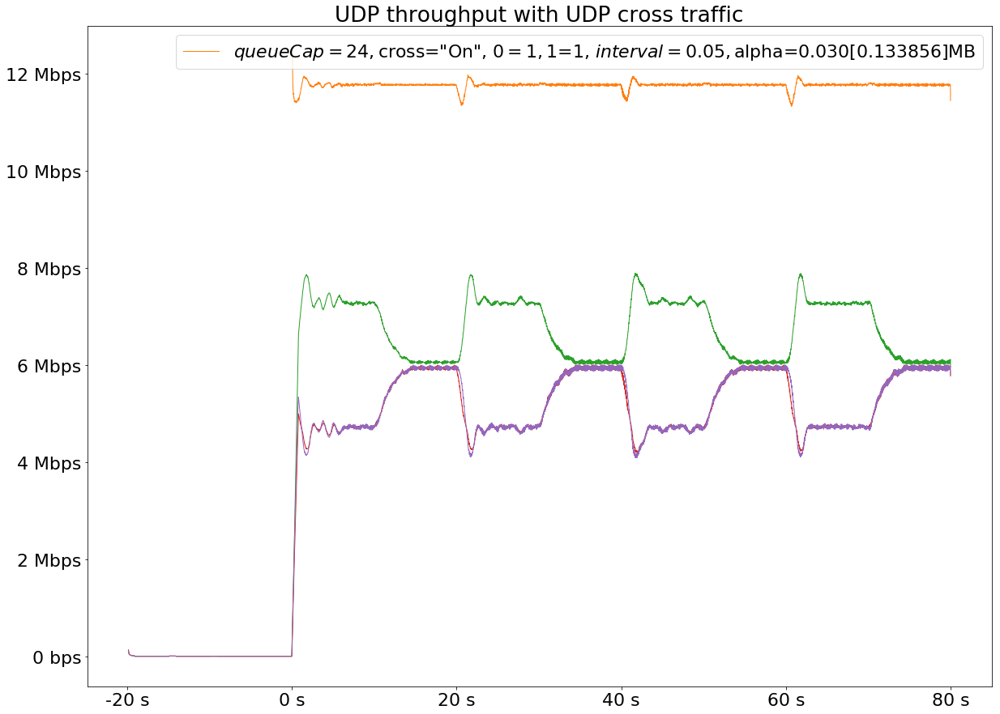

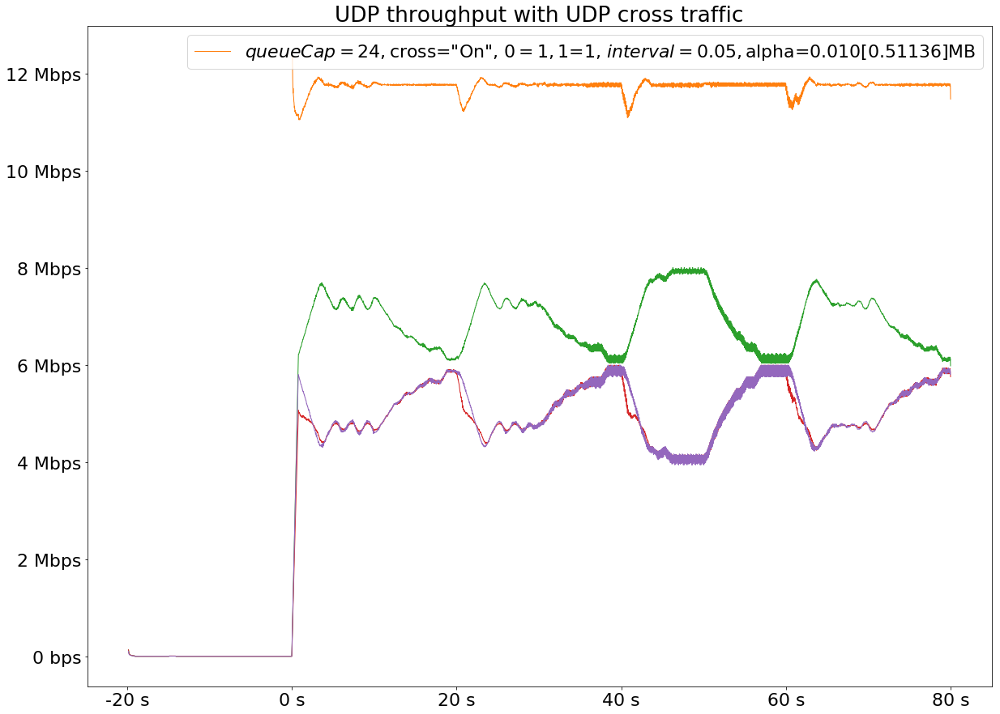

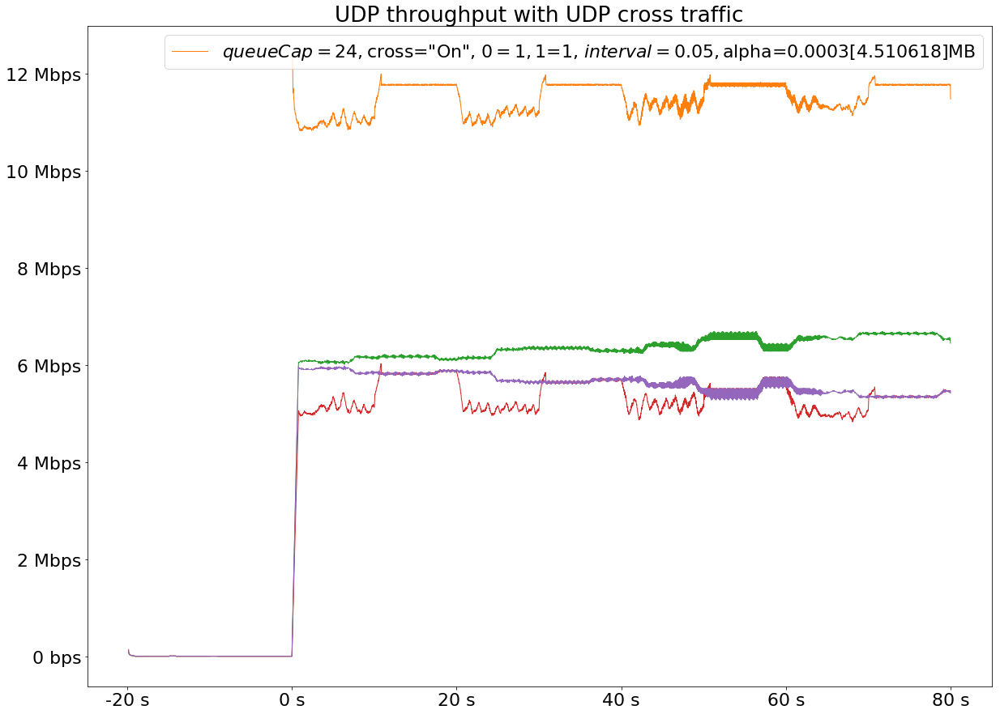

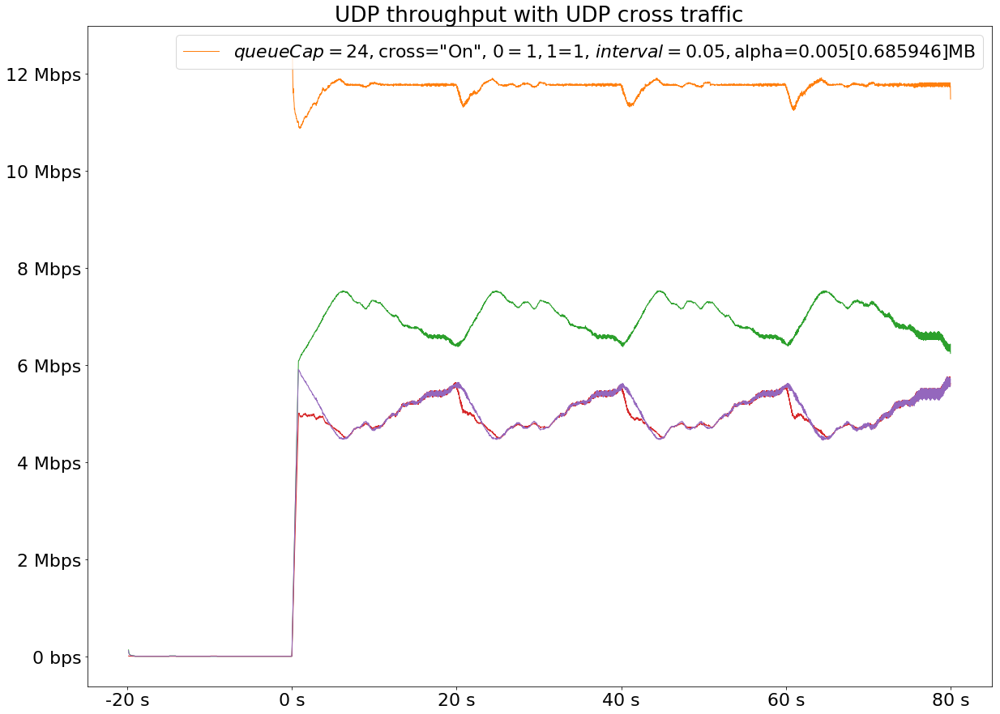

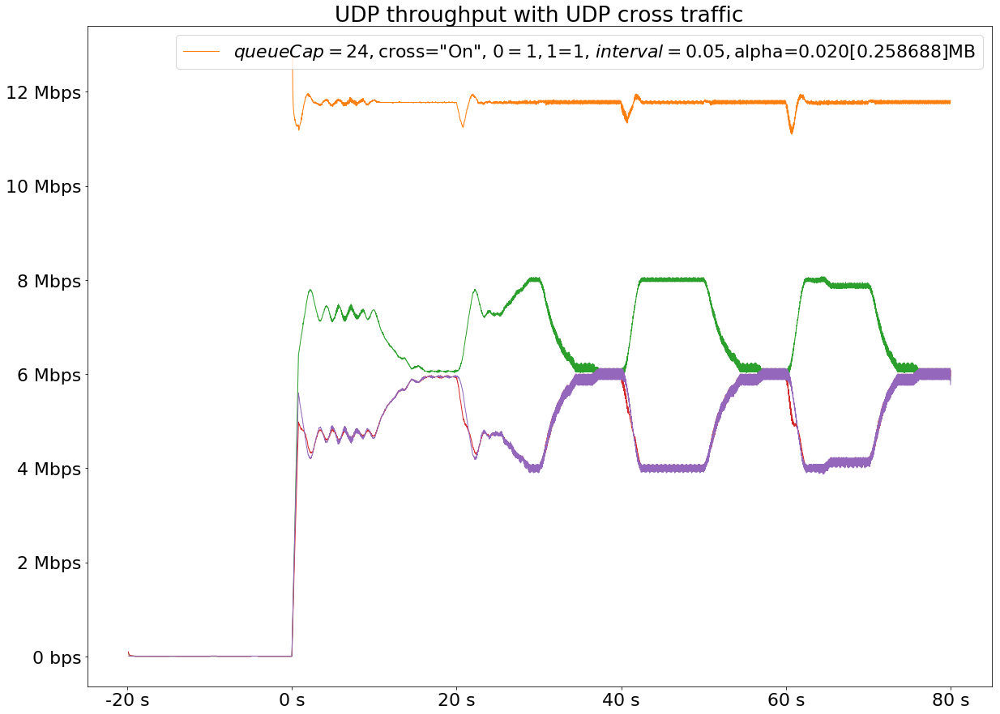

...

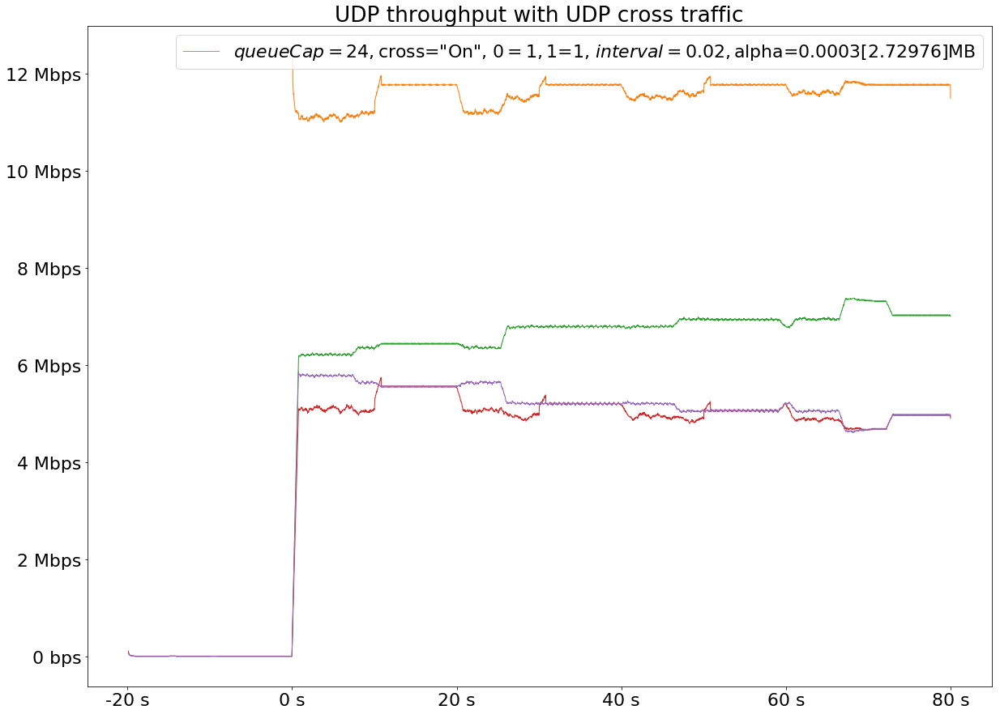

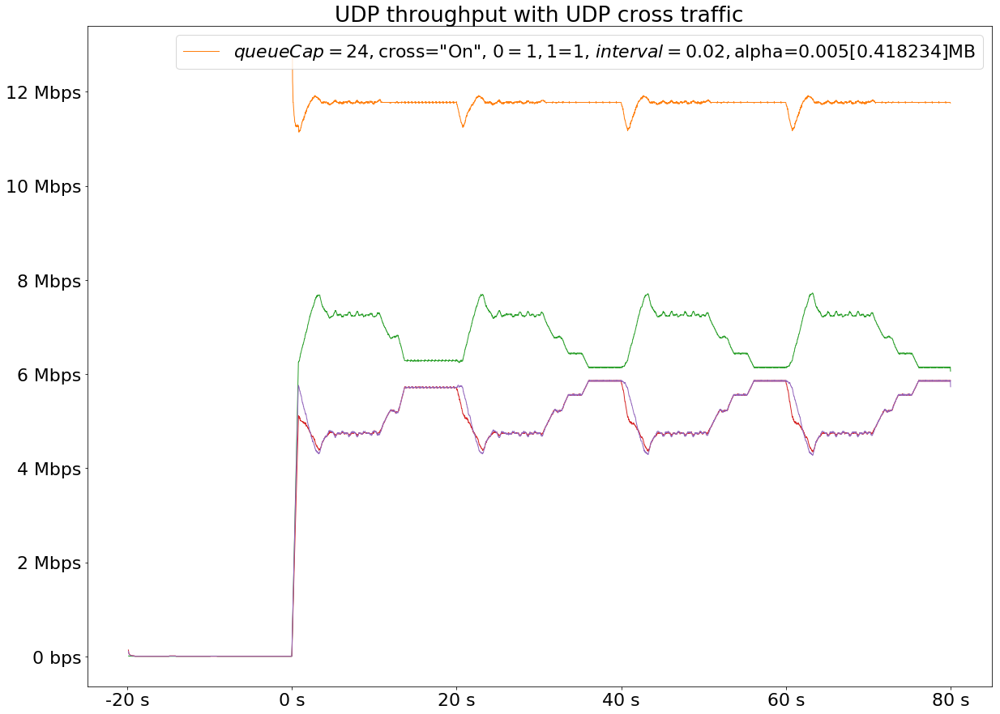

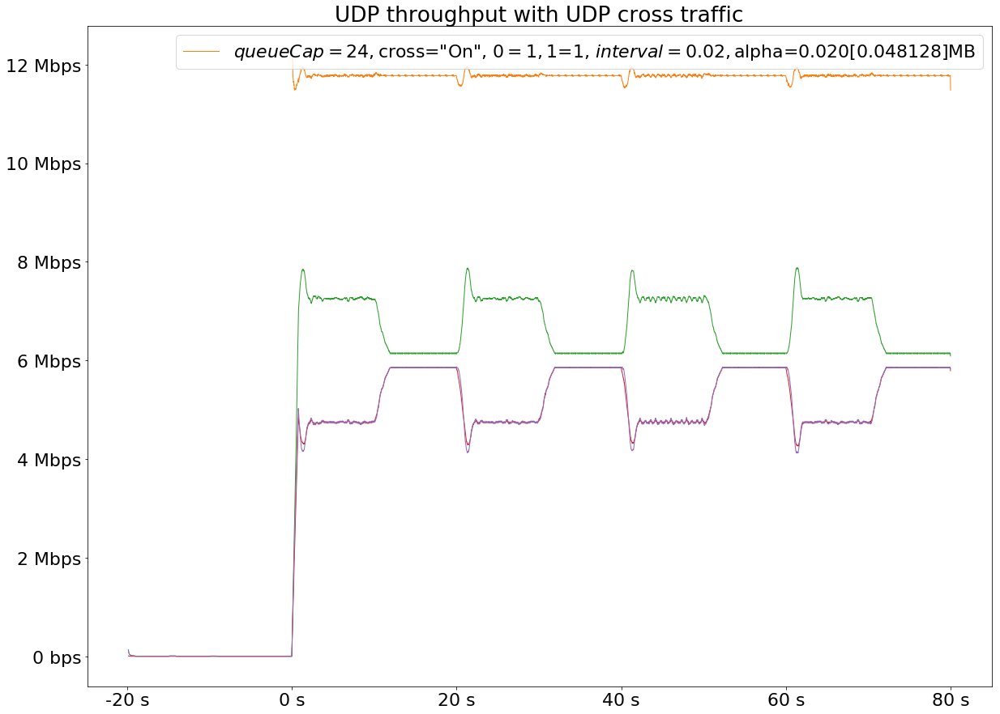

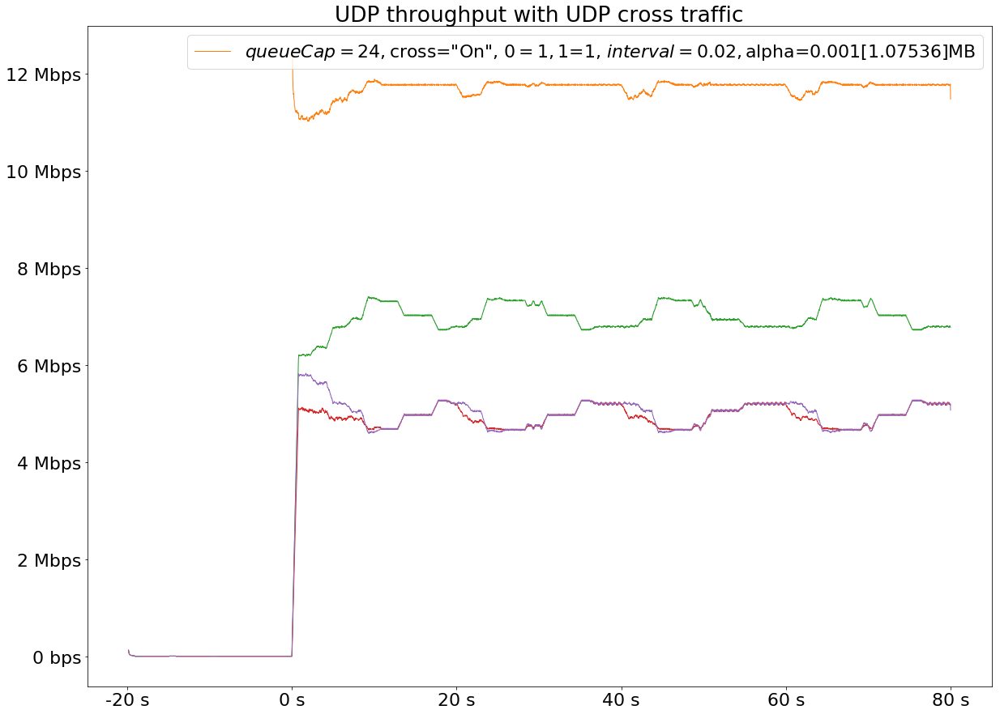

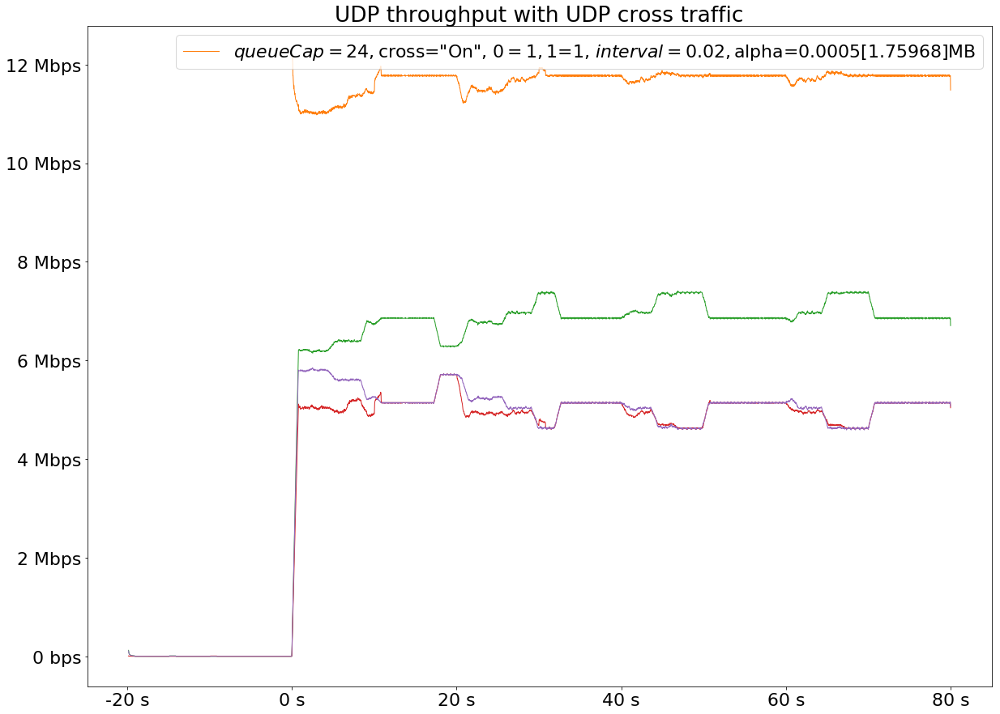

In [8]:
# Trying to plot throughput until first drop, plot the first drop time (at least as a tick on X-axis)

final_version = False
save_figure = True
alphas= {0.030, 0.020, 0.010, 0.005, 0.001, 0.0005, 0.0003}
intervals = {0.010, 0.020, 0.030, 0.040, 0.050, 0.060, 0.070, 0.080, 0.090, 0.1}
for interval in intervals:
    for alpha in alphas:
        figureName="fig/single_conn/Hex_UdpEcnFwdCThrough_int_"+ str(interval) + "_alpha_"+ str(alpha) +".png"
        backupFigureName="fig/single_conn/Backup_UdpEcnFwdCThrough_int_"+ str(interval) + "_alpha_"+ str(alpha) +".png"
        
        plt.rcParams["figure.figsize"] =(20,15)
        plt.rcParams.update({'font.size': 22})
        formatter_x = EngFormatter(unit='s')
        formatter_y = EngFormatter(unit='bps')

        # max_min = vectors_arranged.drop_min_vectime.max()
        max_min = 0
        fig, ax = plt.subplots()
        ax.xaxis.set_major_formatter(formatter_x)
        # ax.set_yscale('log')
        ax.yaxis.set_major_formatter(formatter_y)
        if(not final_version):
            ax.set_title("UDP throughput with UDP cross traffic")
        legend = list()
        # print(vectors_arranged[(vectors_arranged.queueCap > 1) &  (vectors_arranged.cross == "\"On\"")].columns)
        for row in vectors_toPlot[(vectors_toPlot.queueCap < 50) & (vectors_toPlot.alpha == alpha)  & (vectors_toPlot.interval == interval) &  (vectors_toPlot.cross == "\"On\"")].itertuples():
        #     print(row)

        #     appThrough = row._5 # Hexagon.client499.app[0].rcvdPk:vector(packetBytes)
            appThrough = row.Hexagon_client499_app_0__rcvdPk_vector_packetBytes_
        #     bottom = row._14   
            bottom = row.Hexagon_routerCore4_eth_1__encap_decapPk_vector_packetBytes_
            bottomRC1 = row.Hexagon_routerCore1_eth_1__encap_encapPk_vector_packetBytes_ #bottom RouterCore1

        #     top = row._15
            top = row.Hexagon_routerCore4_eth_2__encap_decapPk_vector_packetBytes_
        #     print(top)
            dropSum = 0
            if(not isnan(row.Hexagon_routerCore1_eth_1__queue_red_packetDropCongestion_vector_packetBytes_)):
                dropSum = row.Hexagon_routerCore1_eth_1__queue_red_packetDropCongestion_vector_packetBytes_.sum()

            if(not isnan(row.Hexagon_routerCore1_eth_2__queue_red_packetDropCongestion_vector_packetBytes_)):
                dropSum = row.Hexagon_routerCore1_eth_2__queue_red_packetDropCongestion_vector_packetBytes_.sum()

#             if(not isnan(row.Hexagon_routerCore2_eth_1__queue_red_packetDropCongestion_vector_packetBytes_)):
#                 dropSum = row.Hexagon_routerCore2_eth_1__queue_red_packetDropCongestion_vector_packetBytes_.sum()

            
            if(not isnan(row.Hexagon_routerCore2_eth_2__queue_red_packetDropCongestion_vector_packetBytes_)):
                dropSum = row.Hexagon_routerCore2_eth_2__queue_red_packetDropCongestion_vector_packetBytes_.sum()
            
            itervar = row.iterationvars
        


        #     hasDmpr = row.hasDmpr
            hasDmpr = True
            
            dropSum = dropSum/1000000  #in MB

        #     max_min = max(max_min, drop_min_vectime)
            if(final_version):
                if(hasDmpr):
                    legend.append("With mechanism")
                else:
                    legend.append("Without mechanism")
            else: 
                legend.append(itervar + str(dropSum.real) + str("MB"))
        #         legend.append(itervar + str(" top"))
        #         legend.append(itervar + str(" bottom"))

            color = next(ax._get_lines.prop_cycler)['color']

            appThroughResampled = appThrough.resample('20ms',label='right').sum()*8*50
            appThroughRolling = appThroughResampled.rolling( window=40, min_periods=3).mean()

            plt.plot(appThroughRolling.index.total_seconds() - 20, appThroughRolling.values,  linewidth=1, )



            topResampled = top.resample('20ms',label='right').sum()*8*50
            topRolling = topResampled.rolling( window=40, min_periods=3).mean()

            plt.plot(topRolling.index.total_seconds() - 20, topRolling.values,  linewidth=1, ) #color=color ,label='_nolegend_'

            bottomResampled = bottom.resample('20ms',label='right').sum()*8*50
            bottomRolling = bottomResampled.rolling( window=40, min_periods=3).mean()

            plt.plot(bottomRolling.index.total_seconds() - 20, bottomRolling.values,  linewidth=1,)
            
            bottomRC1Resampled = bottomRC1.resample('20ms',label='right').sum()*8*50
            bottomRC1Rolling = bottomRC1Resampled.rolling( window=40, min_periods=3).mean()

            plt.plot(bottomRC1Rolling.index.total_seconds() - 20, bottomRC1Rolling.values,  linewidth=1,)


                #max line
        #     print(appThroughRolling.fillna(0).values.max())
        #     print(np.max(appThroughRolling.values))
        #     plt.axhline(appThroughRolling.fillna(0).values.max(), linestyle='dashed', linewidth=1.7, color=color, label='_nolegend_')
        #     legend.append(itervar + "; max=" + formatter_y(appThroughRolling.fillna(0).values.max()))

        #     print_series = pd.Series(appThroughputValue, index = pd.to_timedelta(appThroughputIndex,  unit='s'))
        # #     print_series = trimTimeDeltaSeries(print_series, after=pd.to_timedelta(drop_min_vectime, unit='s'))
        #     result = print_series.resample('10ms',label='right').sum()*8*100
        #     resultPlot = result.rolling( window=40, min_periods=3).mean()

        # #     resultPlot = print_series.cumsum()
        # #     resultPlot = trimTimeDeltaSeries(resultPlot, after=pd.to_timedelta(drop_min_vectime, unit='s'))


        #     #get closest index from resultPlot
        # #     idx = resultPlot.index.get_loc(pd.to_timedelta(drop_min_vectime, unit='s'), 'nearest')

        # #     meanLine = result.rolling(window=result.size, min_periods=10).mean()
        #     start = print_series.index.min()
        #     end = print_series.index.max()
        #     avg_speed = 100*8*1000*1000/(end.total_seconds()-20.0)

        #     print(meanLine)

        #     plt.plot(resultPlot.index.total_seconds() - 20, resultPlot.values,  linewidth=1,) #

        #     plt.plot(meanLine.index.total_seconds(), meanLine.values, color='red')
        #     plt.plot(resultPlot.index.total_seconds(), np.ndarray((resultPlot.size), dtype=meanPoint))
        #     dropArray = np.concatenate((row[7], row[8], row[9], row[10]))



        #     ax.scatter(dropArray, np.ones(shape=(dropArray.size, )))
        #     ax.scatter(dropArray, resultPlot[resultPlot.index.get_loc(key=dropArray,method="nearest")], color="green")
            # vertical dotted line originating at mean value


        #     #average line
        #     meanPoint = resultPlot.mean()
        #     meanPoint_text = formatter_y(avg_speed)
        #     legend.append(itervar + "; avg=" + meanPoint_text)
        #     plt.axhline(meanPoint, linestyle='dashed', linewidth=0.7)

        # #     print(row.iterationvars)

        #     fig.savefig("fig/single_conn/Full_SingleConn_"+row[12] + ".png", bbox_inches='tight') 



        # plt.xlim(left= 0.0,right=max_min + 0.11 - 20)
        ax.legend(legend)
        plt.show()
        if(save_figure):
            if(final_version):
                fig.savefig(figureName, bbox_inches='tight') 
            else:
                ax.legend(legend)
                fig.savefig(backupFigureName, bbox_inches='tight')

In [9]:
vectors_toPlot

,queueCap,cross,alpha,interval,iterationvars,Hexagon_client499_app_0__rcvdPk_vector_packetBytes_,Hexagon_routerCore1_dmpr_congLevel_192_168_3_0_eth_2__vector,Hexagon_routerCore1_dmpr_congLevel_192_168_4_0_eth_1__vector,Hexagon_routerCore1_dmpr_congLevel_192_168_4_0_eth_2__vector,Hexagon_routerCore1_dmpr_fwdCongLevel_192_168_3_0_eth_2__vector,...,Hexagon_routerCore4_eth_2__encap_decapPk_vector_packetBytes_,Hexagon_routerCore4_eth_2__encap_encapPk_vector_packetBytes_,Hexagon_routerCore5_eth_1__encap_decapPk_vector_packetBytes_,Hexagon_routerCore5_eth_1__encap_encapPk_vector_packetBytes_,Hexagon_routerCore5_eth_2__encap_decapPk_vector_packetBytes_,Hexagon_routerCore5_eth_2__encap_encapPk_vector_packetBytes_,Hexagon_routerCore6_eth_1__encap_decapPk_vector_packetBytes_,Hexagon_routerCore6_eth_1__encap_encapPk_vector_packetBytes_,Hexagon_routerCore6_eth_2__encap_decapPk_vector_packetBytes_,Hexagon_routerCore6_eth_2__encap_encapPk_vector_packetBytes_
run,,,,,,,,,,,,,,,,,,,,,
HexSingleConnUdpRedUdpCrossIntervalAlpha-0-20190314-16:52:45-31740,24.0,"""On""",0.0300,0.01,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.020667 1472....,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,NaN,...,0 00:00:00.112811 68....,0 00:00:00.087827 64.0 ...,0 00:00:00.088899 64.0 ...,0 00:00:00.111736 68....,0 00:00:00.099704 64....,0 00:00:00.097996 64.0 ...,0 00:00:00.099068 64.0 ...,0 00:00:00.098632 64....,0 00:00:00.109597 64....,0 00:00:00.118226 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-1-20190314-16:54:16-31740,24.0,"""On""",0.0200,0.01,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.017244 ...,0 00:00:20.017244 0.0 00:0...,NaN,...,0 00:00:00.103700 68....,0 00:00:00.084976 64.0 ...,0 00:00:00.086048 64.0 ...,0 00:00:00.102625 68....,0 00:00:00.091052 64....,0 00:00:00.097698 68.0 ...,0 00:00:00.098773 68.0 ...,0 00:00:00.089980 64....,0 00:00:00.101180 68....,0 00:00:00.088402 64.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-10-20190314-16:52:45-31742,24.0,"""On""",0.0050,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.020667 1472....,NaN,0 00:00:20.026466 0.0...,0 00:00:20.026343 0.0 00:0...,NaN,...,0 00:00:00.110343 64....,0 00:00:00.110062 64.0 ...,0 00:00:00.111134 64.0 ...,0 00:00:00.109271 64....,0 00:00:00.112569 68....,0 00:00:00.105860 64.0 ...,0 00:00:00.106932 64.0 ...,0 00:00:00.111494 68....,0 00:00:00.087799 64....,0 00:00:00.098826 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-11-20190314-16:54:12-31742,24.0,"""On""",0.0010,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.027244 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,...,0 00:00:00.084261 64....,0 00:00:00.095232 68.0 ...,0 00:00:00.096307 68.0 ...,0 00:00:00.083189 64....,0 00:00:00.103073 68....,0 00:00:00.099503 64.0 ...,0 00:00:00.100575 64.0 ...,0 00:00:00.101998 68....,0 00:00:00.104908 64....,0 00:00:00.104969 68.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-12-20190314-16:55:44-31742,24.0,"""On""",0.0005,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.026404 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,...,0 00:00:00.117766 68....,0 00:00:00.113578 64.0 ...,0 00:00:00.114650 64.0 ...,0 00:00:00.116691 68....,0 00:00:00.111657 68....,0 00:00:00.100248 64.0 ...,0 00:00:00.101320 64.0 ...,0 00:00:00.110582 68....,0 00:00:00.107768 68....,0 00:00:00.095377 64.0 ...
HexSingleConnUdpRedUdpCrossIntervalAlpha-13-20190314-16:57:24-31742,24.0,"""On""",0.0003,0.02,"$queueCap=24, $cross=""On"", $0=1, $1=1, $interv...",0 00:00:20.019319 1472....,NaN,0 00:00:20.027244 0.0...,0 00:00:20.027244 0.0 00:0...,NaN,...,0 00:00:00.081660 64....,0 00:00:00.106980 68.0 ...,0 00:00:00.108055 68.0 ...,0 00:00:00.080588 64....,0 00:00:00.093521 68....,0 00:00:00.090341 64.0 ...,0 00:00:00.091413 64.0 ...,0 00:00:00.092446 68....,0 00:00:00.115664 68....,0 00:00:00.109233 64.0 ...
HexSingleConn

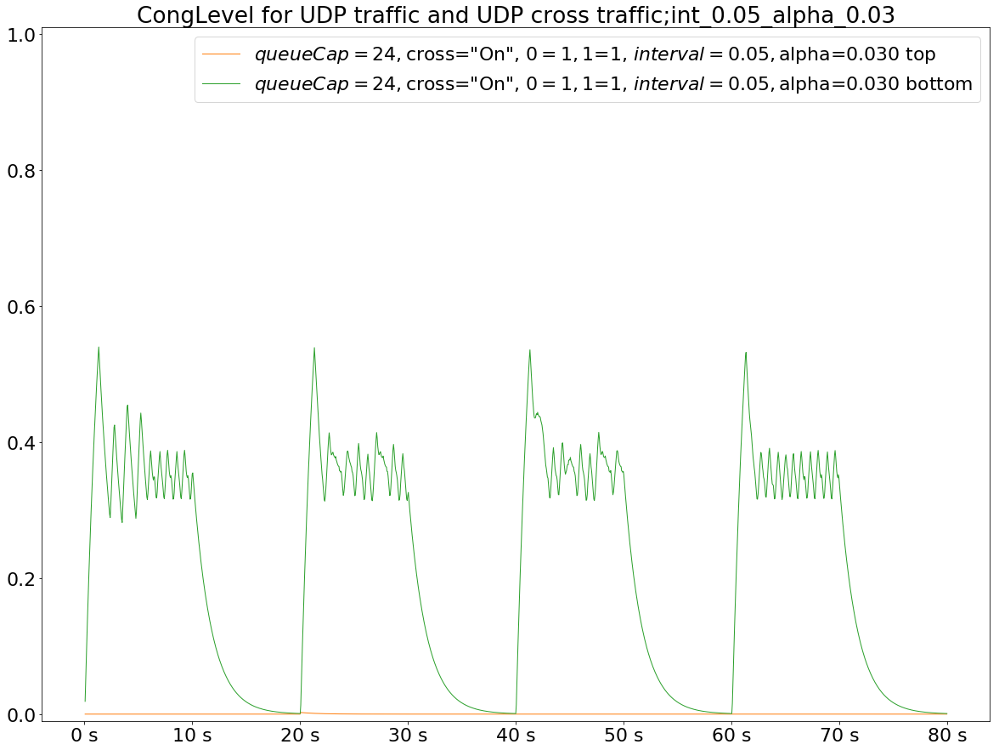

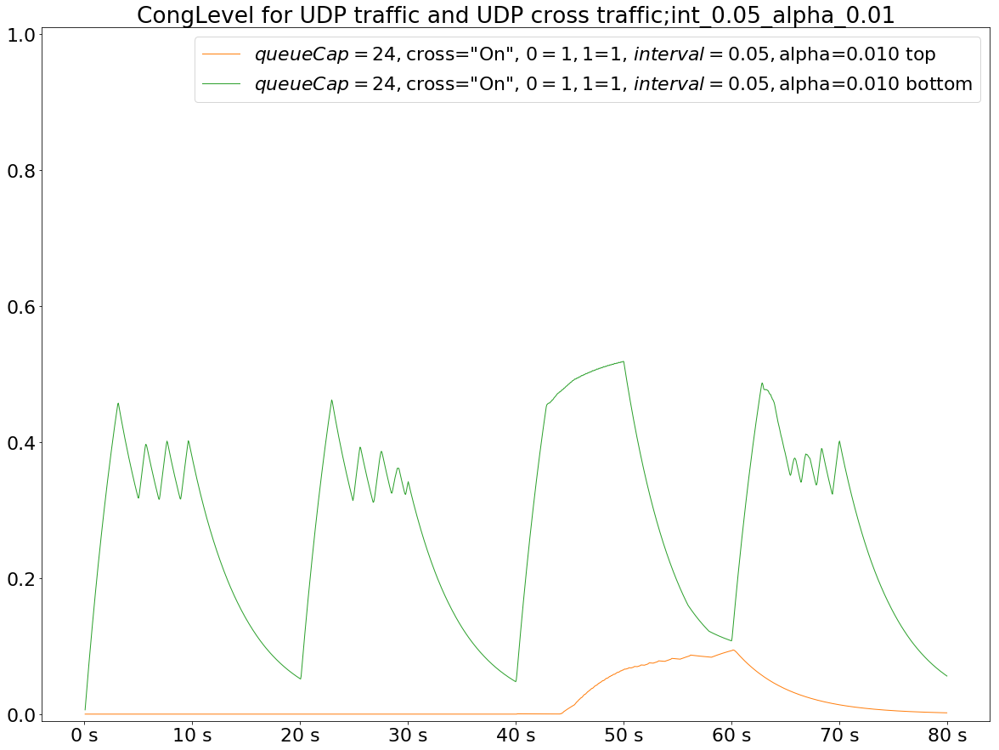

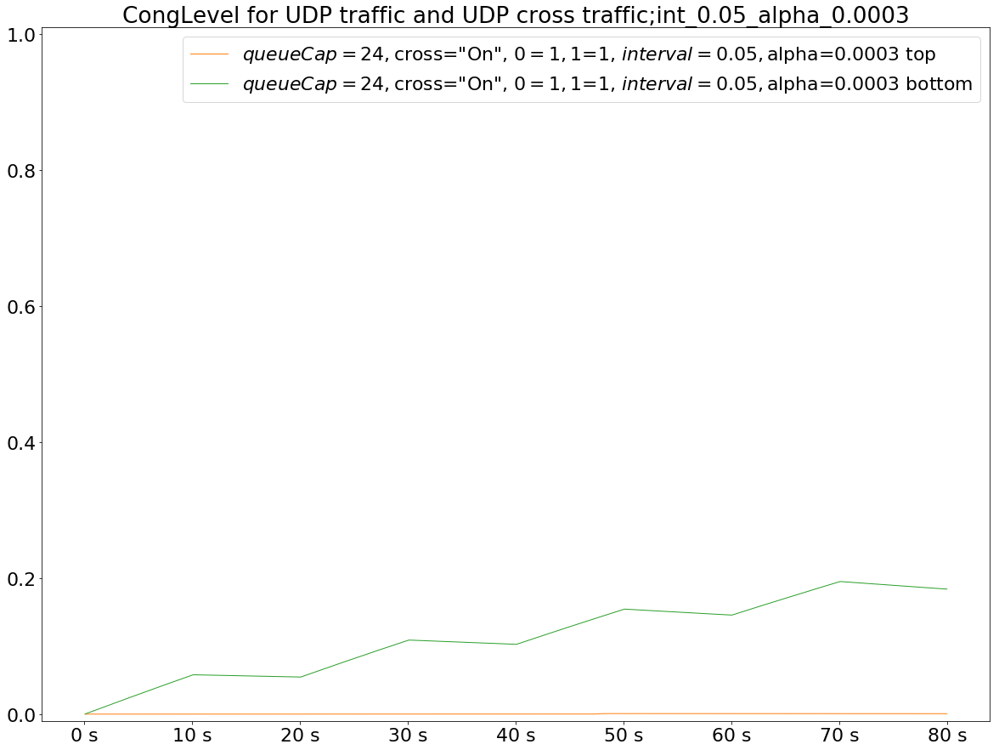

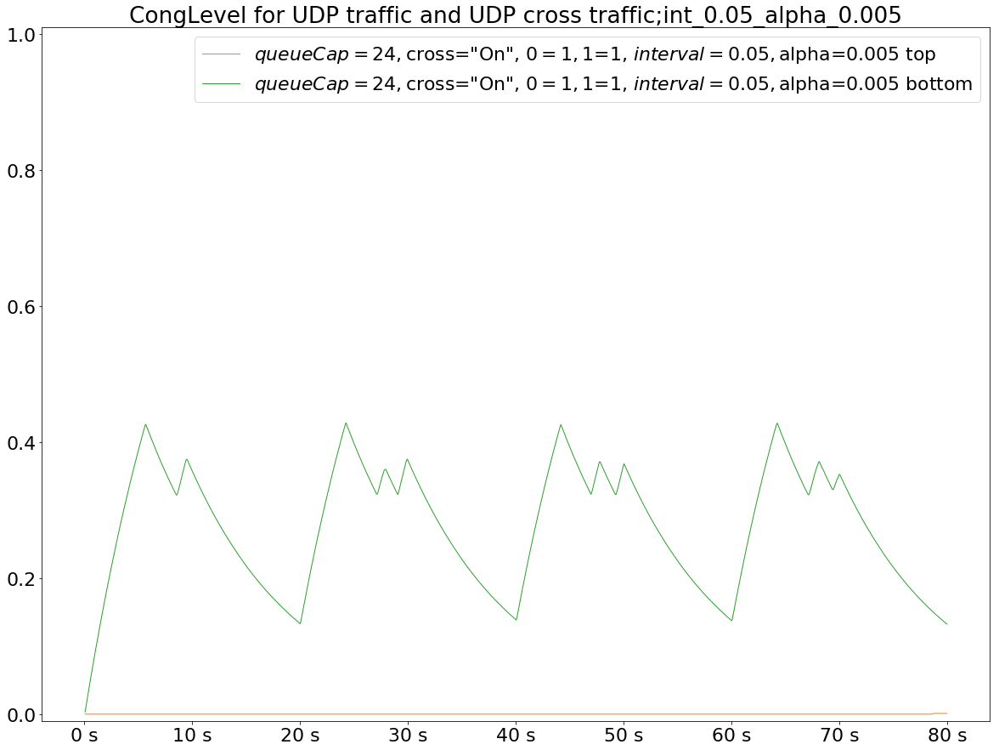

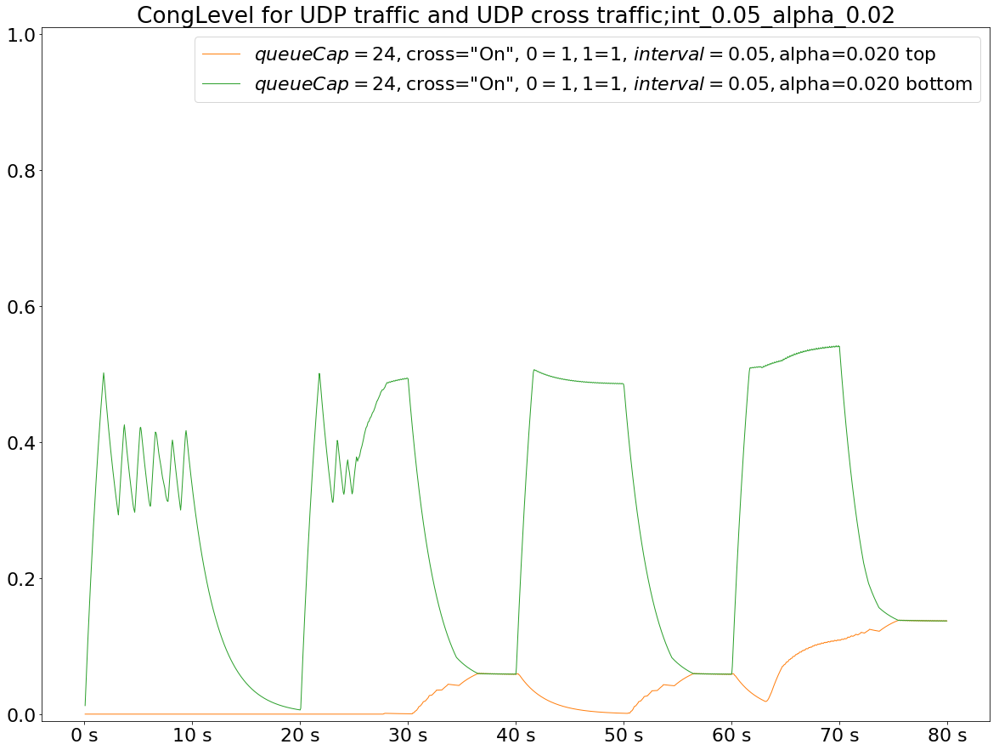

...

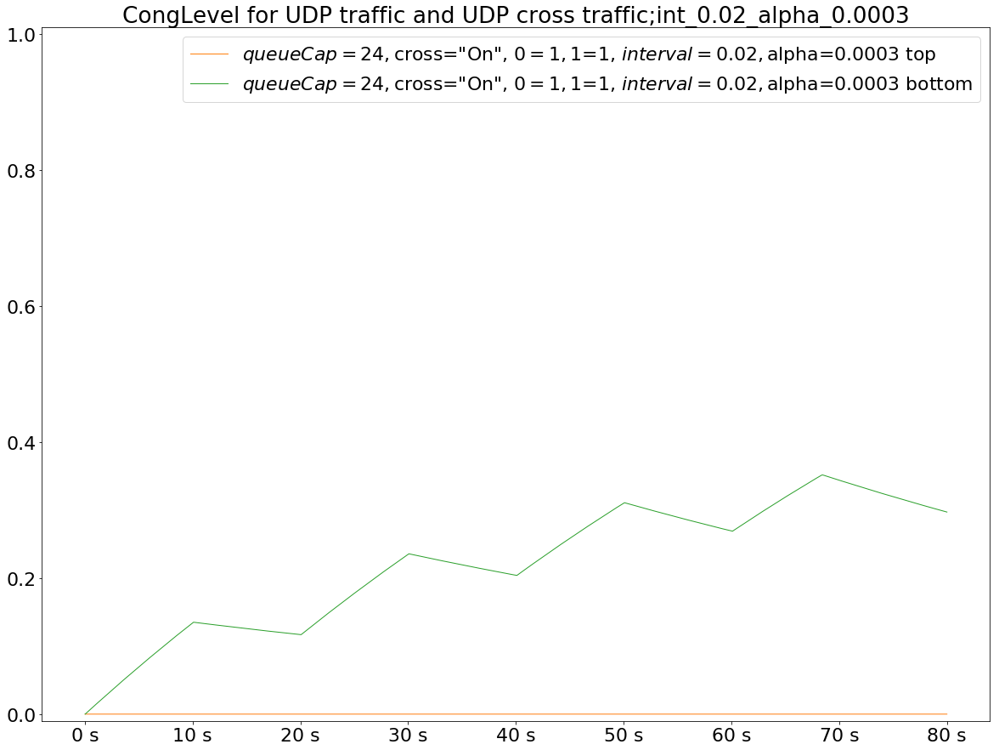

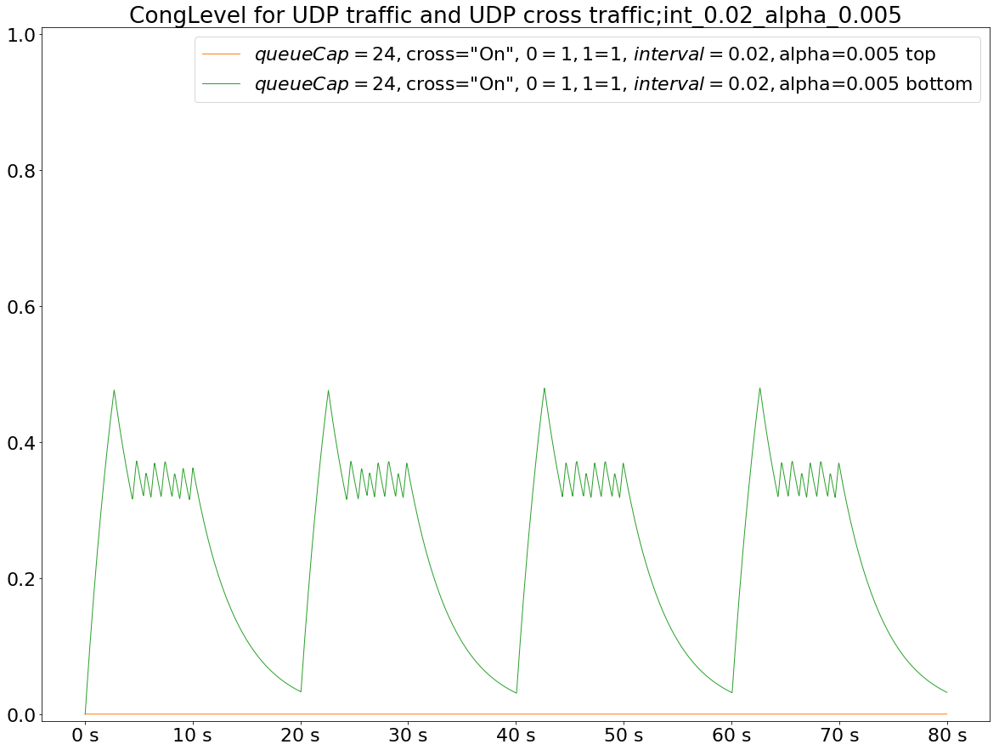

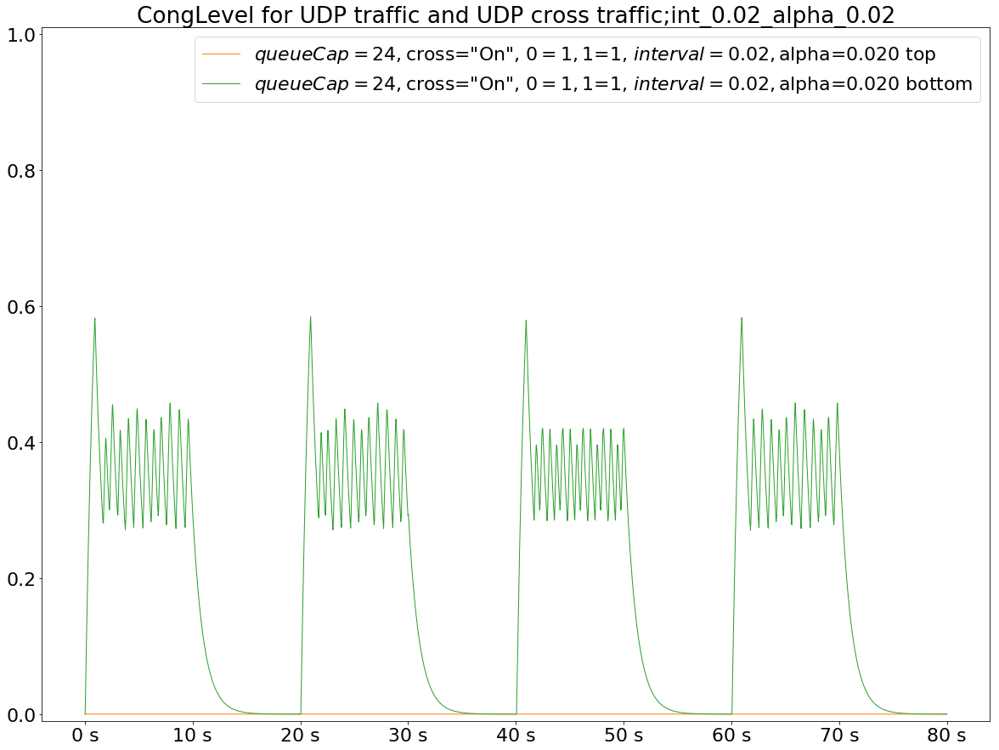

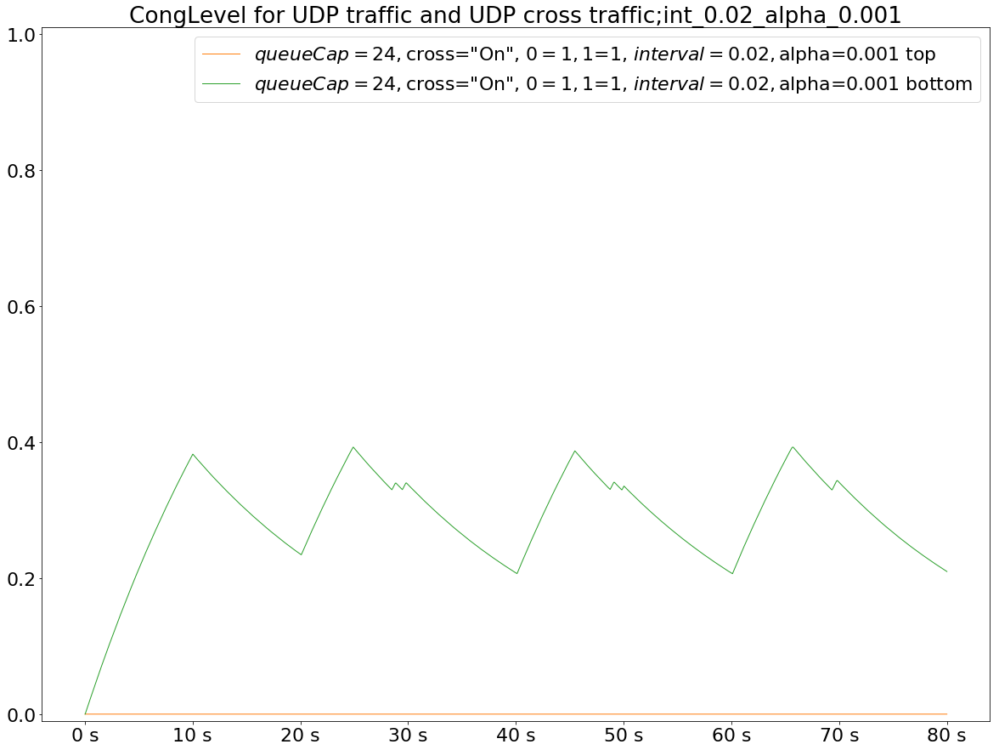

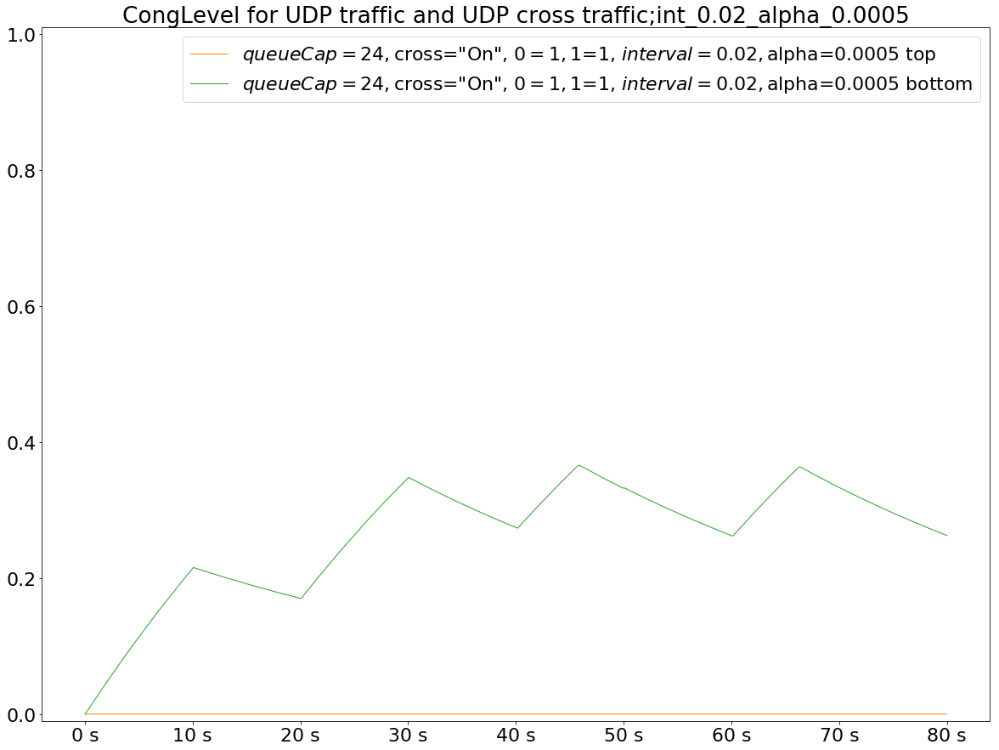

In [10]:
# CongLevel

final_version = False
save_figure = True
alphas= {0.030, 0.020, 0.01, 0.005, 0.001, 0.0005, 0.0003}
intervals = {0.010, 0.020, 0.030, 0.040, 0.050, 0.060, 0.070, 0.080, 0.090, 0.1}
for interval in intervals:
    for alpha in alphas:
        figureName="fig/single_conn/Hex_UdpEcnFwdCCongLev_int_"+ str(interval) + "_alpha_"+ str(alpha) +".png"
        backupFigureName="fig/single_conn/Backup_UdpEcnFwdCCongLev_int_"+ str(interval) + "_alpha_"+ str(alpha) +".png"

        plt.rcParams["figure.figsize"] =(20,15)
        plt.rcParams.update({'font.size': 22})
        formatter_x = EngFormatter(unit='s')
        # formatter_y = EngFormatter(unit='bps')

        # max_min = vectors_arranged.drop_min_vectime.max()
        max_min = 0
        fig, ax = plt.subplots()
        ax.xaxis.set_major_formatter(formatter_x)
        # ax.set_yscale('log')
        # ax.yaxis.set_major_formatter(formatter_y)
        if(not final_version):
            ax.set_title("CongLevel for UDP traffic and UDP cross traffic;int_"+ str(interval) + "_alpha_"+ str(alpha))
        legend = list()
        # print(vectors_arranged[(vectors_arranged.queueCap > 1) &  (vectors_arranged.cross == "\"On\"")].columns)
        for row in vectors_toPlot[(vectors_toPlot.queueCap < 50) & (vectors_toPlot.alpha == alpha)  & (vectors_toPlot.interval == interval) &  (vectors_toPlot.cross == "\"On\"")].itertuples():
        #     print(row)

        #     appThrough = row._5 # Hexagon.client499.app[0].rcvdPk:vector(packetBytes)
        #     appThrough = row.Hexagon_client499_app_0__rcvdPk_vector_packetBytes_
        #     bottom = row._14   
            bottom = row.Hexagon_routerCore1_dmpr_congLevel_192_168_4_0_eth_1__vector

        #     top = row._15
            top = row.Hexagon_routerCore1_dmpr_congLevel_192_168_4_0_eth_2__vector


            itervar = row.iterationvars

        #     hasDmpr = row.hasDmpr
            hasDmpr = True

        #     max_min = max(max_min, drop_min_vectime)
            if(final_version):
                if(hasDmpr):
                    legend.append("With mechanism")
                else:
                    legend.append("Without mechanism")
            else: 
        #         legend.append(itervar)
                legend.append(itervar + str(" top"))
                legend.append(itervar + str(" bottom"))

            color = next(ax._get_lines.prop_cycler)['color']

        #     appThroughResampled = appThrough.resample('20ms',label='right').sum()*8*50
        #     appThroughRolling = appThroughResampled.rolling( window=40, min_periods=3).mean()

        #     plt.plot(appThroughRolling.index.total_seconds() - 20, appThroughRolling.values,  linewidth=1, color=color)



        #     topResampled = top.resample('20ms',label='right').sum()*8*50
        #     topRolling = topResampled.rolling( window=40, min_periods=3).mean()

            plt.plot(top.index.total_seconds() - 20, top.values,  linewidth=1, )

        #     bottomResampled = bottom.resample('20ms',label='right').sum()*8*50
        #     bottomRolling = bottomResampled.rolling( window=40, min_periods=3).mean()

            if(not isnan( bottom)):
                plt.plot(bottom.index.total_seconds() - 20, bottom.values,  linewidth=1,)


                #max line
        #     print(appThroughRolling.fillna(0).values.max())
        #     print(np.max(appThroughRolling.values))
        #     plt.axhline(appThroughRolling.fillna(0).values.max(), linestyle='dashed', linewidth=1.7, color=color, label='_nolegend_')
        #     legend.append(itervar + "; max=" + formatter_y(appThroughRolling.fillna(0).values.max()))

        #     print_series = pd.Series(appThroughputValue, index = pd.to_timedelta(appThroughputIndex,  unit='s'))
        # #     print_series = trimTimeDeltaSeries(print_series, after=pd.to_timedelta(drop_min_vectime, unit='s'))
        #     result = print_series.resample('10ms',label='right').sum()*8*100
        #     resultPlot = result.rolling( window=40, min_periods=3).mean()

        # #     resultPlot = print_series.cumsum()
        # #     resultPlot = trimTimeDeltaSeries(resultPlot, after=pd.to_timedelta(drop_min_vectime, unit='s'))


        #     #get closest index from resultPlot
        # #     idx = resultPlot.index.get_loc(pd.to_timedelta(drop_min_vectime, unit='s'), 'nearest')

        # #     meanLine = result.rolling(window=result.size, min_periods=10).mean()
        #     start = print_series.index.min()
        #     end = print_series.index.max()
        #     avg_speed = 100*8*1000*1000/(end.total_seconds()-20.0)

        #     print(meanLine)

        #     plt.plot(resultPlot.index.total_seconds() - 20, resultPlot.values,  linewidth=1,) #

        #     plt.plot(meanLine.index.total_seconds(), meanLine.values, color='red')
        #     plt.plot(resultPlot.index.total_seconds(), np.ndarray((resultPlot.size), dtype=meanPoint))
        #     dropArray = np.concatenate((row[7], row[8], row[9], row[10]))



        #     ax.scatter(dropArray, np.ones(shape=(dropArray.size, )))
        #     ax.scatter(dropArray, resultPlot[resultPlot.index.get_loc(key=dropArray,method="nearest")], color="green")
            # vertical dotted line originating at mean value


        #     #average line
        #     meanPoint = resultPlot.mean()
        #     meanPoint_text = formatter_y(avg_speed)
        #     legend.append(itervar + "; avg=" + meanPoint_text)
        #     plt.axhline(meanPoint, linestyle='dashed', linewidth=0.7)

        # #     print(row.iterationvars)

        #     fig.savefig("fig/single_conn/Full_SingleConn_"+row[12] + ".png", bbox_inches='tight') 



        # plt.xlim(left= 9.0,right=20)
        plt.ylim(bottom=-0.01, top=1.01)
        ax.legend(legend)
        plt.show()
        if(save_figure):
            if(final_version):
                fig.savefig(figureName, bbox_inches='tight') 
            else:
                ax.legend(legend)
                fig.savefig(backupFigureName, bbox_inches='tight')

In [ ]:

result = vectors.apply(lambda x: pd.Series(x["vecvalue"].tolist(), index = pd.to_timedelta(x["vectime"].tolist(),  unit='s')), axis=1)



In [ ]:
# result

In [ ]:
# series_df = pd.DataFrame(columns=["serz"])
for row in vectors[["run", "vecvalue", "vectime"]].head(1).itertuples():
    print (row.Index)
    tmp= pd.Series(row.vecvalue, index=pd.to_timedelta(row.vectime, unit="s"))
#     print(tmp)
#     tmp.name = "serz"
    vectors.loc[row.Index,"hovno"]=tmp
    vectors.insert(loc=1 column="hovno", value=tmp)
#     print(series_df.loc[row.Index])

In [ ]:
# loaded_csv.loc[loaded_csv.type=="vector"]
# vectors = loaded_csv.loc[loaded_csv.type=="vector", ['run', 'module' , 'name',  'vectime', 'vecvalue', 'iterationvars']]
# vectors["module_name"] = vectors["module"].map(str) + "." +  vectors["name"]
vectors.loc[vectors.module.str.contains("Hexagon.routerCore4.eth\[.*\]")]
vectors.pivot(index = 'run', columns = 'module_name', values = ['vectime', 'vecvalue'])

In [ ]:
# pd.set_option('max_colwidth', 80)
# save column order
col_order= loaded_csv.columns.tolist()
#create dictionary of reduce functions           
agg_dict = {"type": "first","attrname": "first", "attrvalue" : "first","value": "first","vectime": lambda x: list(np.hstack(x)), "vecvalue": lambda x: list(np.hstack(x)), "cross": "first","hasDmpr": "first","queueCap": "first","iterationvars": "first"}
#get copy of vectors
df_slice = loaded_csv[(loaded_csv.type=="vector")]

loaded_csv = df_slice.groupby(['run', 'module', 'name'], as_index = False).agg(agg_dict) 
loaded_csv = loaded_csv[col_order]
loaded_csv.head(25)


In [ ]:
df_slice = loaded_csv[(loaded_csv.type=="vector")]
df_slice

In [ ]:
#filter

# type(loaded_csv[(loaded_csv.type=="vector") ].vecvalue.iloc[1])
# loaded_csv.head()
res = df_slice
print(len(res))
print(res[res.duplicated(subset=['run', 'module',], keep=False)])
# res[res.duplicated(subset=['run', 'module'], keep=False)]

# loaded_csv.columns.tolist()

In [ ]:
# loaded_csv['hasDmpr']
#get vectors
vectors = loaded_csv[loaded_csv.type=="vector"]
#filter the entries so that only one 'run' for combinations of 'values' exists
# for example use module that have only one statistic
vectors = vectors[vectors.module=="Hexagon.client499.app[0]"]
itervar_columns = vectors.pivot(index = 'run', columns = 'module', values = ['hasDmpr', 'queueCap', 'cross'])
# print(itervar_columns)
# drop the 'module_name' level (or is it named index?)
itervar_columns = itervar_columns.xs('Hexagon.client499.app[0]', axis=1, level=1, drop_level=True)
itervar_columns

In [ ]:
vectors = loaded_csv.loc[loaded_csv.type=="vector", ['run', 'module' , 'name',  'vectime', 'vecvalue', 'iterationvars']]
vectors["module_name"] = vectors["module"].map(str) + "." +  vectors["name"]

vectors.head(25)




In [ ]:
vectors_toPlot=vectors.pivot(index = 'run', columns = 'module_name', values = ['vecvalue', 'vectime', 'iterationvars'])
vectors_toPlot = vectors_toPlot.apply(lambda x:x.apply(lambda x:[] if isnan(x) else x))
vectors_toPlot.head()


In [ ]:
vectors_arranged = vectors_toPlot.swaplevel(0,1,axis=1).sort_index(1)
vectors_arranged

In [ ]:
vectors_arranged[["hasDmpr", "queueCap","cross"]] = itervar_columns
# print (vectors_arranged.iterationvars)
# print(loaded_csv["iterationvars"])
print(vectors_arranged)

In [ ]:
# Trying to plot throughput until first drop, plot the first drop time (at least as a tick on X-axis)

final_version = False
save_figure = False

plt.rcParams["figure.figsize"] =(15,10)
plt.rcParams.update({'font.size': 22})
formatter_x = EngFormatter(unit='s')
formatter_y = EngFormatter(unit='bps')

# max_min = vectors_arranged.drop_min_vectime.max()
max_min = 0
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(formatter_x)
# ax.set_yscale('log')
ax.yaxis.set_major_formatter(formatter_y)
if(not final_version):
    ax.set_title("UDP throughput with UDP cross traffic; first packet drop")
legend = list()
print(vectors_arranged[(vectors_arranged.queueCap > 1) &  (vectors_arranged.cross == "\"On\"")].columns)
for row in vectors_arranged[(vectors_arranged.queueCap > 1) &  (vectors_arranged.cross == "\"On\"")].itertuples():
#     print(row)

    print(row)
    #For hexagon topology (fewer ethernet interfaces)
    #For Fulltest topology -> hexagon + 4 (2 interfaces *(vectime, vecvalue))
    itervar = row[1]
    print(itervar)
#     drop_min_vectime = row[9]
#     drop_min_vectime = pd.to_timedelta(row[7], unit='s')
#     drop_min_vectime.date
    
    appThroughputValue = row[3]
    appThroughputIndex = row[2]
    hasDmpr = row[34]
    
#     max_min = max(max_min, drop_min_vectime)
    if(final_version):
        if(hasDmpr):
            legend.append("With mechanism")
        else:
            legend.append("Without mechanism")
    else: 
        legend.append(itervar)
        
    

    #     print(pd.to_timedelta(row.vectime,  unit='s'))
    print_series = pd.Series(appThroughputValue, index = pd.to_timedelta(appThroughputIndex,  unit='s'))
#     print_series = trimTimeDeltaSeries(print_series, after=pd.to_timedelta(drop_min_vectime, unit='s'))
    result = print_series.resample('10ms',label='right').sum()*8*100
    resultPlot = result.rolling( window=40, min_periods=3).mean()

#     resultPlot = print_series.cumsum()
#     resultPlot = trimTimeDeltaSeries(resultPlot, after=pd.to_timedelta(drop_min_vectime, unit='s'))
    
    
    #get closest index from resultPlot
#     idx = resultPlot.index.get_loc(pd.to_timedelta(drop_min_vectime, unit='s'), 'nearest')

#     meanLine = result.rolling(window=result.size, min_periods=10).mean()
    start = print_series.index.min()
    end = print_series.index.max()
    avg_speed = 100*8*1000*1000/(end.total_seconds()-20.0)

#     print(meanLine)
    plt.plot(resultPlot.index.total_seconds() - 20, resultPlot.values,  linewidth=1,) #
#     plt.plot(meanLine.index.total_seconds(), meanLine.values, color='red')
#     plt.plot(resultPlot.index.total_seconds(), np.ndarray((resultPlot.size), dtype=meanPoint))
#     dropArray = np.concatenate((row[7], row[8], row[9], row[10]))



#     ax.scatter(dropArray, np.ones(shape=(dropArray.size, )))
#     ax.scatter(dropArray, resultPlot[resultPlot.index.get_loc(key=dropArray,method="nearest")], color="green")
    # vertical dotted line originating at mean value
    
    
#     #average line
#     meanPoint = resultPlot.mean()
#     meanPoint_text = formatter_y(avg_speed)
#     legend.append(itervar + "; avg=" + meanPoint_text)
#     plt.axhline(meanPoint, linestyle='dashed', linewidth=0.7)
    
# #     print(row.iterationvars)
    
#     fig.savefig("fig/single_conn/Full_SingleConn_"+row[12] + ".png", bbox_inches='tight') 



# plt.xlim(left= 0.0,right=max_min + 0.11 - 20)
ax.legend(legend)
plt.show()
if(save_figure):
    if(final_version):
        fig.savefig("fig/single_conn/Hex_UdpEcn.png", bbox_inches='tight') 
    else:
        ax.legend(legend)
        fig.savefig("fig/single_conn/Backup_UdpEcn.png", bbox_inches='tight')

In [ ]:
vectors_arranged
